In [1]:
from datetime import datetime, timedelta
import pandas as pd
pd.core.common.is_list_like = pd.api.types.is_list_like #For solving import pandas_datareader issue
import numpy as np
import datetime
import csv
import requests
import pandas_datareader.data as web
import pandas_datareader as pdr
from pandas_datareader import data, wb
import nsepy


In [2]:
#pip install nsepy

In [3]:
start = datetime.datetime(2020,3,20)
end = datetime.datetime(2020,4,20)

In [4]:
sbin = nsepy.get_history(symbol='SBIN',
                    start=datetime.datetime(2000,4,1), 
                    end=datetime.datetime(2020,7,12))

In [5]:
sbin

,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
Date,,,,,,,,,,,,,,
2000-04-03,SBIN,EQ,204.75,205.00,219.65,205.00,211.50,213.30,214.44,3924088,8.414777e+13,NaN,NaN,NaN
2000-04-04,SBIN,EQ,213.30,210.55,211.50,196.25,196.25,196.35,200.50,2934025,5.882657e+13,NaN,NaN,NaN
2000-04-05,SBIN,EQ,196.35,197.00,203.00,187.50,196.50,196.20,194.80,2155066,4.197978e+13,NaN,NaN,NaN
2000-04-06,SBIN,EQ,196.20,198.00,206.40,194.30,203.75,203.90,201.20,3351461,6.743140e+13,NaN,NaN,NaN
2000-04-07,SBIN,EQ,203.90,204.00,219.50,204.00,216.25,218.10,213.65,7451592,1.592001e+14,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-07-06,SBIN,EQ,184.70,186.60,189.85,186.15,187.90,188.05,188.35,43789749,8.247963e+14,215925.0,9492655.0,0.2168
2020-07-07,SBIN,EQ,188.05,187.00,189.20,184.05,188.00,188.60,186.66,55124984,1.028941e+15,245296.0,7395581.0,0.1342
2020-07-08,SBIN,EQ,188.60,188.90,197.45,188.40,191.70,191.90,194.17,143083196,2.778285e+15,620914.0,33127615.0,0.2315


In [6]:
print("checking if any null values are present\n", sbin.isna().sum())

checking if any null values are present
 Symbol                   0
Series                   0
Prev Close               0
Open                     0
High                     0
Low                      0
Last                     0
Close                    0
VWAP                     0
Volume                   0
Turnover                 0
Trades                2789
Deliverable Volume     452
%Deliverble            452
dtype: int64


In [7]:
sbin.drop(['Trades', 'Deliverable Volume','%Deliverble'], axis = 1,inplace=True) 

In [8]:
sbin

,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover
Date,,,,,,,,,,,
2000-04-03,SBIN,EQ,204.75,205.00,219.65,205.00,211.50,213.30,214.44,3924088,8.414777e+13
2000-04-04,SBIN,EQ,213.30,210.55,211.50,196.25,196.25,196.35,200.50,2934025,5.882657e+13
2000-04-05,SBIN,EQ,196.35,197.00,203.00,187.50,196.50,196.20,194.80,2155066,4.197978e+13
2000-04-06,SBIN,EQ,196.20,198.00,206.40,194.30,203.75,203.90,201.20,3351461,6.743140e+13
2000-04-07,SBIN,EQ,203.90,204.00,219.50,204.00,216.25,218.10,213.65,7451592,1.592001e+14
...,...,...,...,...,...,...,...,...,...,...,...
2020-07-06,SBIN,EQ,184.70,186.60,189.85,186.15,187.90,188.05,188.35,43789749,8.247963e+14
2020-07-07,SBIN,EQ,188.05,187.00,189.20,184.05,188.00,188.60,186.66,55124984,1.028941e+15
2020-07-08,SBIN,EQ,188.60,188.90,197.45,188.40,191.70,191.90,194.17,143083196,2.778285e+15


In [9]:
from matplotlib import pyplot as plt
import seaborn as sns

sns.set(rc={'figure.figsize':(11.7,8.27)})


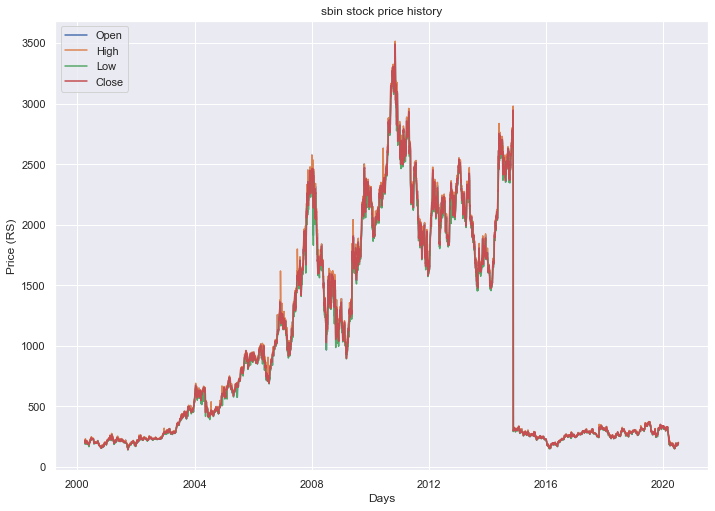

In [10]:

plt.figure()
plt.plot(sbin["Open"])
plt.plot(sbin["High"])
plt.plot(sbin["Low"])
plt.plot(sbin["Close"])
plt.title('sbin stock price history')
plt.ylabel('Price (RS)')
plt.xlabel('Days')
plt.legend(['Open','High','Low','Close'], loc='upper left')
plt.show()

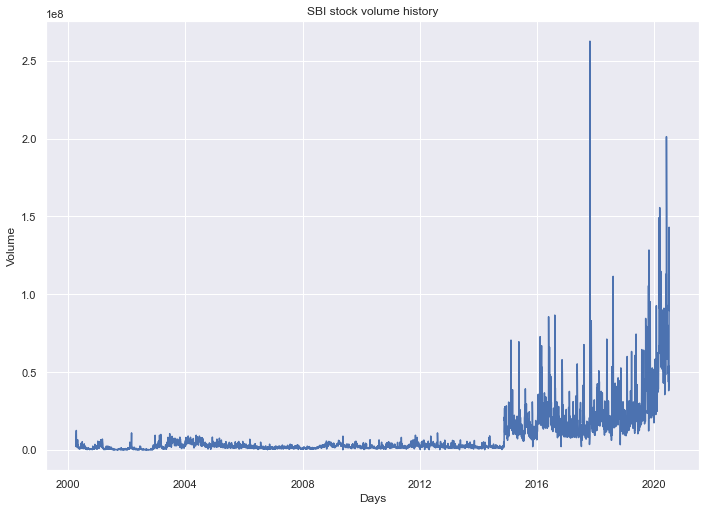

In [11]:
plt.figure()
plt.plot(sbin["Volume"])
plt.title('SBI stock volume history')
plt.ylabel('Volume')
plt.xlabel('Days')
plt.show()

In [12]:
sbin

,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover
Date,,,,,,,,,,,
2000-04-03,SBIN,EQ,204.75,205.00,219.65,205.00,211.50,213.30,214.44,3924088,8.414777e+13
2000-04-04,SBIN,EQ,213.30,210.55,211.50,196.25,196.25,196.35,200.50,2934025,5.882657e+13
2000-04-05,SBIN,EQ,196.35,197.00,203.00,187.50,196.50,196.20,194.80,2155066,4.197978e+13
2000-04-06,SBIN,EQ,196.20,198.00,206.40,194.30,203.75,203.90,201.20,3351461,6.743140e+13
2000-04-07,SBIN,EQ,203.90,204.00,219.50,204.00,216.25,218.10,213.65,7451592,1.592001e+14
...,...,...,...,...,...,...,...,...,...,...,...
2020-07-06,SBIN,EQ,184.70,186.60,189.85,186.15,187.90,188.05,188.35,43789749,8.247963e+14
2020-07-07,SBIN,EQ,188.05,187.00,189.20,184.05,188.00,188.60,186.66,55124984,1.028941e+15
2020-07-08,SBIN,EQ,188.60,188.90,197.45,188.40,191.70,191.90,194.17,143083196,2.778285e+15


In [13]:

#X_train = X[:4000]
#X_test = X[4000:]
#y_train = y[:4000]
#y_test=y[4000:]

In [14]:
sbin

,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover
Date,,,,,,,,,,,
2000-04-03,SBIN,EQ,204.75,205.00,219.65,205.00,211.50,213.30,214.44,3924088,8.414777e+13
2000-04-04,SBIN,EQ,213.30,210.55,211.50,196.25,196.25,196.35,200.50,2934025,5.882657e+13
2000-04-05,SBIN,EQ,196.35,197.00,203.00,187.50,196.50,196.20,194.80,2155066,4.197978e+13
2000-04-06,SBIN,EQ,196.20,198.00,206.40,194.30,203.75,203.90,201.20,3351461,6.743140e+13
2000-04-07,SBIN,EQ,203.90,204.00,219.50,204.00,216.25,218.10,213.65,7451592,1.592001e+14
...,...,...,...,...,...,...,...,...,...,...,...
2020-07-06,SBIN,EQ,184.70,186.60,189.85,186.15,187.90,188.05,188.35,43789749,8.247963e+14
2020-07-07,SBIN,EQ,188.05,187.00,189.20,184.05,188.00,188.60,186.66,55124984,1.028941e+15
2020-07-08,SBIN,EQ,188.60,188.90,197.45,188.40,191.70,191.90,194.17,143083196,2.778285e+15


In [15]:
sbin.iloc[:,2:4]

,Prev Close,Open
Date,,
2000-04-03,204.75,205.00
2000-04-04,213.30,210.55
2000-04-05,196.35,197.00
2000-04-06,196.20,198.00
2000-04-07,203.90,204.00
...,...,...
2020-07-06,184.70,186.60
2020-07-07,188.05,187.00
2020-07-08,188.60,188.90


In [212]:
data=sbin.iloc[:,2:4]
data

,Prev Close,Open
Date,,
2000-04-03,204.75,205.00
2000-04-04,213.30,210.55
2000-04-05,196.35,197.00
2000-04-06,196.20,198.00
2000-04-07,203.90,204.00
...,...,...
2020-07-06,184.70,186.60
2020-07-07,188.05,187.00
2020-07-08,188.60,188.90


In [213]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
scaler = MinMaxScaler(feature_range = (0, 1))

#scaler = StandardScaler()
sc=scaler.fit(data)
data = pd.DataFrame(sc.transform(data))

data=data.values.tolist()
data

[[0.018903986859787968, 0.0184851954850319],
 [0.021457368971181126, 0.0201359249289889],
 [0.016395400925787666, 0.016105765655904707],
 [0.016350604748394802, 0.016403194384545607],
 [0.01865014185456175, 0.018187766756391],
 [0.022890846647752733, 0.022723554868164714],
 [0.023846498432133795, 0.022351768957363585],
 [0.023682245781693298, 0.022946626414645385],
 [0.02284605047035987, 0.021608197135761342],
 [0.018933850978049872, 0.017667266481269428],
 [0.016679110049275803, 0.016670880240322414],
 [0.01778408242496641, 0.0187826242136728],
 [0.018306704494549804, 0.016938566096099228],
 [0.018515753322383158, 0.0178903380277501],
 [0.01784381066149022, 0.0167006231131865],
 [0.01769449007018068, 0.0190800529423137],
 [0.02199492309989548, 0.0205671965855182],
 [0.01948633716589518, 0.01893133857799325],
 [0.019411676870240403, 0.0190800529423137],
 [0.016216216216216217, 0.016105765655904707],
 [0.016470061221442442, 0.016641137367458328],
 [0.018411228908466477, 0.01845545261216

In [214]:
X=[]
y=[]
for i in range(len(data)-60):
    temp=[]
    for j in range(60):
            temp.append(data[i+j][0])
            temp.append(data[i+j][1])
            
            #print(j)
    #print(training_set[i][0])
    #print("j=",j)
    if(i+j+59<len(data)):
        X.append(temp)
        y.append(data[i+j][1])

In [215]:
len(X)

4928

In [216]:
len(y)

4928

In [217]:
X

[[0.018903986859787968,
  0.0184851954850319,
  0.021457368971181126,
  0.0201359249289889,
  0.016395400925787666,
  0.016105765655904707,
  0.016350604748394802,
  0.016403194384545607,
  0.01865014185456175,
  0.018187766756391,
  0.022890846647752733,
  0.022723554868164714,
  0.023846498432133795,
  0.022351768957363585,
  0.023682245781693298,
  0.022946626414645385,
  0.02284605047035987,
  0.021608197135761342,
  0.018933850978049872,
  0.017667266481269428,
  0.016679110049275803,
  0.016670880240322414,
  0.01778408242496641,
  0.0187826242136728,
  0.018306704494549804,
  0.016938566096099228,
  0.018515753322383158,
  0.0178903380277501,
  0.01784381066149022,
  0.0167006231131865,
  0.01769449007018068,
  0.0190800529423137,
  0.02199492309989548,
  0.0205671965855182,
  0.01948633716589518,
  0.01893133857799325,
  0.019411676870240403,
  0.0190800529423137,
  0.016216216216216217,
  0.016105765655904707,
  0.016470061221442442,
  0.016641137367458328,
  0.018411228908466

In [218]:
import plotly.express as px
px.line(y)

In [219]:
#len(features)
y

[0.025326056243772585,
 0.025920913701054385,
 0.025192213315884185,
 0.025861427955326213,
 0.026515771158336185,
 0.027705486072899785,
 0.026218342429695285,
 0.026218342429695285,
 0.026753714141248913,
 0.025028627515131685,
 0.026515771158336185,
 0.026218342429695285,
 0.025326056243772585,
 0.024433770057849885,
 0.023838912600568085,
 0.026069628065374828,
 0.023957884092024456,
 0.023244055143286285,
 0.021905625864402242,
 0.016105765655904707,
 0.0184851954850319,
 0.015139122287821778,
 0.016789851731778778,
 0.018009309519206464,
 0.01744419493478875,
 0.016403194384545607,
 0.01812828101066282,
 0.0172954805704683,
 0.017860595154886014,
 0.017533423553381028,
 0.0184851954850319,
 0.01803905239207055,
 0.017057537587555578,
 0.0167006231131865,
 0.0175929092991092,
 0.0178903380277501,
 0.0159719227280163,
 0.016403194384545607,
 0.016403194384545607,
 0.0169980518418274,
 0.01714676620614785,
 0.016432937257409692,
 0.016135508528768792,
 0.016879080350371042,
 0.01684

In [220]:
y=np.array(y).reshape(-1,1)
y

array([[0.02532606],
       [0.02592091],
       [0.02519221],
       ...,
       [0.01307199],
       [0.01313148],
       [0.01164433]])

In [221]:
y.shape

(4928, 1)

In [222]:
print(len(X))
print(len(y))

4928
4928


In [223]:

#y=pd.DataFrame(sc.transform(y))


X_train, X_test, y_train, y_test = train_test_split(X, y,random_state=1,test_size=0.20,shuffle=False)

In [224]:
X_train

[[0.018903986859787968,
  0.0184851954850319,
  0.021457368971181126,
  0.0201359249289889,
  0.016395400925787666,
  0.016105765655904707,
  0.016350604748394802,
  0.016403194384545607,
  0.01865014185456175,
  0.018187766756391,
  0.022890846647752733,
  0.022723554868164714,
  0.023846498432133795,
  0.022351768957363585,
  0.023682245781693298,
  0.022946626414645385,
  0.02284605047035987,
  0.021608197135761342,
  0.018933850978049872,
  0.017667266481269428,
  0.016679110049275803,
  0.016670880240322414,
  0.01778408242496641,
  0.0187826242136728,
  0.018306704494549804,
  0.016938566096099228,
  0.018515753322383158,
  0.0178903380277501,
  0.01784381066149022,
  0.0167006231131865,
  0.01769449007018068,
  0.0190800529423137,
  0.02199492309989548,
  0.0205671965855182,
  0.01948633716589518,
  0.01893133857799325,
  0.019411676870240403,
  0.0190800529423137,
  0.016216216216216217,
  0.016105765655904707,
  0.016470061221442442,
  0.016641137367458328,
  0.018411228908466

In [225]:
y_train

array([[0.02532606],
       [0.02592091],
       [0.02519221],
       ...,
       [0.01448478],
       [0.01445504],
       [0.01353301]])

In [226]:
y_train.shape

(3942, 1)

In [227]:
X_train.shape

AttributeError: 'list' object has no attribute 'shape'

In [229]:
X_train = np.array(X_train)
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
y_train=np.array(y_train)
X_train.shape

(3942, 120, 1)

In [230]:
X_train

array([[[0.01890399],
        [0.0184852 ],
        [0.02145737],
        ...,
        [0.02532606],
        [0.02556369],
        [0.02532606]],

       [[0.02145737],
        [0.02013592],
        [0.0163954 ],
        ...,
        [0.02532606],
        [0.02599671],
        [0.02592091]],

       [[0.0163954 ],
        [0.01610577],
        [0.0163506 ],
        ...,
        [0.02592091],
        [0.02645961],
        [0.02519221]],

       ...,

       [[0.01630581],
        [0.01634371],
        [0.01279677],
        ...,
        [0.01357762],
        [0.01384202],
        [0.01448478]],

       [[0.01279677],
        [0.01250688],
        [0.01181126],
        ...,
        [0.01448478],
        [0.01506645],
        [0.01445504]],

       [[0.01181126],
        [0.01168895],
        [0.01239361],
        ...,
        [0.01445504],
        [0.01352845],
        [0.01353301]]])

In [231]:
#pip install seq2seq-lstm
X_train

array([[[0.01890399],
        [0.0184852 ],
        [0.02145737],
        ...,
        [0.02532606],
        [0.02556369],
        [0.02532606]],

       [[0.02145737],
        [0.02013592],
        [0.0163954 ],
        ...,
        [0.02532606],
        [0.02599671],
        [0.02592091]],

       [[0.0163954 ],
        [0.01610577],
        [0.0163506 ],
        ...,
        [0.02592091],
        [0.02645961],
        [0.02519221]],

       ...,

       [[0.01630581],
        [0.01634371],
        [0.01279677],
        ...,
        [0.01357762],
        [0.01384202],
        [0.01448478]],

       [[0.01279677],
        [0.01250688],
        [0.01181126],
        ...,
        [0.01448478],
        [0.01506645],
        [0.01445504]],

       [[0.01181126],
        [0.01168895],
        [0.01239361],
        ...,
        [0.01445504],
        [0.01352845],
        [0.01353301]]])

In [233]:
X_train.shape

(3942, 120, 1)

In [234]:
y_train.shape

(3942, 1)

In [235]:
#X_train and y_train both have to be scaled
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout


regressor = Sequential()
print(X_train.shape)
print(X_train.shape[1])
regressor.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
regressor.add(Dropout(0.2))

regressor.add(LSTM(units = 50, return_sequences = True))
regressor.add(Dropout(0.2))

regressor.add(LSTM(units = 50, return_sequences = True))
regressor.add(Dropout(0.2))

regressor.add(LSTM(units = 50))
regressor.add(Dropout(0.2))

regressor.add(Dense(units = 1))

regressor.compile(optimizer = 'adam', loss = 'mean_squared_error')
print(X_train.shape[1])
regressor.fit(X_train, y_train, epochs = 10, batch_size = 32)

(3942, 120, 1)
120
120
Epoch 1/10
124/124 [==============================] - 14s 111ms/step - loss: 0.0090
Epoch 2/10
124/124 [==============================] - 13s 108ms/step - loss: 0.0037
Epoch 3/10
124/124 [==============================] - 14s 113ms/step - loss: 0.0030
Epoch 4/10
124/124 [==============================] - 14s 112ms/step - loss: 0.0025
Epoch 5/10
124/124 [==============================] - 13s 108ms/step - loss: 0.0023
Epoch 6/10
124/124 [==============================] - 13s 108ms/step - loss: 0.0021
Epoch 7/10
124/124 [==============================] - 13s 108ms/step - loss: 0.0020
Epoch 8/10
124/124 [==============================] - 13s 109ms/step - loss: 0.0019
Epoch 9/10
124/124 [==============================] - 13s 108ms/step - loss: 0.0016
Epoch 10/10
124/124 [==============================] - 13s 108ms/step - loss: 0.0016


In [236]:
y_pred=regressor.predict(X_train)

In [237]:
px.line(y_pred)

In [238]:
px.line(y_train)

In [239]:
#test_set=sbin.iloc[4000:, 1:2].values
#real_stock_price = sbin.iloc[4000:, 2:3].values
#len(real_stock_price)
y_test

array([[0.01417248],
       [0.01509451],
       [0.01728061],
       [0.01579347],
       [0.01726574],
       [0.01603141],
       [0.01458888],
       [0.01330994],
       [0.01313148],
       [0.01209048],
       [0.01112383],
       [0.01133203],
       [0.01298276],
       [0.01330994],
       [0.01265559],
       [0.01316122],
       [0.01341404],
       [0.01253662],
       [0.01060333],
       [0.01012745],
       [0.01134691],
       [0.00911619],
       [0.00875928],
       [0.00771828],
       [0.00852133],
       [0.00959208],
       [0.01223919],
       [0.01705754],
       [0.01664114],
       [0.01876775],
       [0.01635858],
       [0.01729548],
       [0.01623961],
       [0.01713189],
       [0.02001695],
       [0.01997234],
       [0.01977901],
       [0.01744419],
       [0.01829187],
       [0.01989798],
       [0.02175691],
       [0.02197998],
       [0.01937748],
       [0.02145948],
       [0.02116205],
       [0.02086463],
       [0.01875288],
       [0.020

In [240]:
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
print(X_test.shape)


(986, 120, 1)


In [241]:
predicted_stock_price = regressor.predict(X_test)
predicted_stock_price

array([[0.01641702],
       [0.01672834],
       [0.01712008],
       [0.01765694],
       [0.0182405 ],
       [0.01875278],
       [0.01900895],
       [0.0188787 ],
       [0.01836778],
       [0.01761489],
       [0.01674945],
       [0.01589075],
       [0.01522384],
       [0.01494761],
       [0.01507908],
       [0.01541077],
       [0.01576997],
       [0.01604174],
       [0.01605485],
       [0.01570854],
       [0.01514032],
       [0.01452479],
       [0.01388312],
       [0.01321844],
       [0.01257247],
       [0.01211218],
       [0.01206963],
       [0.01269144],
       [0.014043  ],
       [0.01584632],
       [0.01765326],
       [0.01901774],
       [0.01977067],
       [0.0199742 ],
       [0.0199918 ],
       [0.02020514],
       [0.02067083],
       [0.02117865],
       [0.02143464],
       [0.02144718],
       [0.02150893],
       [0.02184682],
       [0.02237809],
       [0.02286594],
       [0.02322844],
       [0.02343229],
       [0.02350379],
       [0.023

In [242]:
#predicted_stock_price = sc.inverse_transform(predicted_stock_price)
y_test

array([[0.01417248],
       [0.01509451],
       [0.01728061],
       [0.01579347],
       [0.01726574],
       [0.01603141],
       [0.01458888],
       [0.01330994],
       [0.01313148],
       [0.01209048],
       [0.01112383],
       [0.01133203],
       [0.01298276],
       [0.01330994],
       [0.01265559],
       [0.01316122],
       [0.01341404],
       [0.01253662],
       [0.01060333],
       [0.01012745],
       [0.01134691],
       [0.00911619],
       [0.00875928],
       [0.00771828],
       [0.00852133],
       [0.00959208],
       [0.01223919],
       [0.01705754],
       [0.01664114],
       [0.01876775],
       [0.01635858],
       [0.01729548],
       [0.01623961],
       [0.01713189],
       [0.02001695],
       [0.01997234],
       [0.01977901],
       [0.01744419],
       [0.01829187],
       [0.01989798],
       [0.02175691],
       [0.02197998],
       [0.01937748],
       [0.02145948],
       [0.02116205],
       [0.02086463],
       [0.01875288],
       [0.020

In [243]:
sc.inverse_transform(data)[:,0]

array([204.75, 213.3 , 196.35, ..., 188.6 , 191.9 , 199.1 ])

In [244]:
#predicted_stock_price = sc.inverse_transform(predicted_stock_price)
#sc.inverse_transform(data)

scale=MinMaxScaler()
scale.min_,scale.scale_=sc.min_[1],sc.scale_[1]
y_pred=scale.inverse_transform(predicted_stock_price)
y_pred

array([[198.04648],
       [199.0932 ],
       [200.41028],
       [202.21527],
       [204.17729],
       [205.89967],
       [206.76094],
       [206.32301],
       [204.60524],
       [202.07391],
       [199.16415],
       [196.2771 ],
       [194.03482],
       [193.1061 ],
       [193.54813],
       [194.66333],
       [195.87099],
       [196.78474],
       [196.82883],
       [195.66447],
       [193.75401],
       [191.68451],
       [189.52713],
       [187.29237],
       [185.12051],
       [183.57295],
       [183.4299 ],
       [185.52052],
       [190.06465],
       [196.1277 ],
       [202.2029 ],
       [206.7905 ],
       [209.32195],
       [210.00626],
       [210.06543],
       [210.78273],
       [212.34845],
       [214.0558 ],
       [214.91647],
       [214.95865],
       [215.16628],
       [216.30229],
       [218.0885 ],
       [219.72871],
       [220.9475 ],
       [221.63287],
       [221.87328],
       [221.54625],
       [221.05852],
       [221.01286],


In [245]:
y_actual=scale.inverse_transform(y_test)

In [246]:
fig=px.line(y_actual)
fig.show()

In [247]:
df=pd.DataFrame(y_pred)
df['y_actual']=y_actual
df.columns=['y_pred','y_actual']
df

,y_pred,y_actual
0,198.046478,190.50
1,199.093201,193.60
2,200.410278,200.95
3,202.215271,195.95
4,204.177292,200.90
...,...,...
981,200.233963,182.90
982,198.263840,188.00
983,196.702698,186.80
984,195.857788,187.00


In [248]:
px.line(df,y=['y_pred','y_actual'])